In [87]:
import requests
import pandas as pd
from datetime import datetime, timedelta
from dotenv import load_dotenv
import os
import time
import matplotlib.pyplot as plt
import seaborn as sns

# Load environment variables from .env file
load_dotenv()

True

In [15]:
API_KEY = os.getenv("premium_alpha_api_key")
BASE_URL = "https://www.alphavantage.co/query"

In [16]:
# list of 68 stocks over 10B EBIT from stockanalysis
stock_analysis_data = pd.read_csv('screener_stocks_68.csv')
symbols = stock_analysis_data['Symbol'].tolist()

In [17]:
print(company_names) # checking all company symbols

['BRK.A', 'BRK.B', 'AAPL', 'MSFT', 'GOOG', 'GOOGL', 'NVDA', 'META', 'AMZN', 'XOM', 'TM', 'TSM', 'PBR.A', 'PBR', 'UNH', 'SHEL', 'VZ', 'EQNR', 'WMT', 'T', 'TTE', 'V', 'JNJ', 'CMCSA', 'BHP', 'CVX', 'HD', 'PG', 'BN', 'MRK', 'BABA', 'STLA', 'NVS', 'NVO', 'TMUS', 'ABBV', 'ORCL', 'MA', 'COP', 'PDD', 'BUD', 'LLY', 'AVGO', 'RIO', 'PEP', 'BTI', 'KO', 'CAT', 'AZN', 'PM', 'BP', 'CHTR', 'VALE', 'DE', 'GM', 'DIS', 'MO', 'MCD', 'UL', 'CSCO', 'PFE', 'GILD', 'CB', 'ELV', 'PGR', 'HCA', 'LOW', 'QCOM']


In [99]:
def fetch_api_data(function, symbol):
    url = f'{BASE_URL}?function={function}&symbol={symbol}&apikey={API_KEY}'
    response = requests.get(url).json()
    return response

# Function to extract earnings
def fetch_earnings(symbol):
    return fetch_api_data('EARNINGS', symbol)

# Function to extract financial statement (Income Statement)
def fetch_financial_statement(symbol):
    return fetch_api_data('INCOME_STATEMENT', symbol)

# Function to extract balance sheet
def fetch_balance_sheet(symbol):
    return fetch_api_data('BALANCE_SHEET', symbol)

# Function to extract current stock price
def fetch_current_price(symbol):
    return fetch_api_data('GLOBAL_QUOTE', symbol)

def fetch_historical_prices(symbol):
    return fetch_api_data('TIME_SERIES_DAILY_ADJUSTED', symbol)

In [40]:
fetch_current_price("AAPL")

{'Global Quote': {'01. symbol': 'AAPL',
  '02. open': '228.0600',
  '03. high': '230.7199',
  '04. low': '228.0600',
  '05. price': '229.8700',
  '06. volume': '38168252',
  '07. latest trading day': '2024-11-22',
  '08. previous close': '228.5200',
  '09. change': '1.3500',
  '10. change percent': '0.5908%'}}

In [72]:
def calculate_earnings_yield(eps, stock_price):
    if eps is not None and stock_price is not None and stock_price > 0:
        return eps / stock_price
    return None

def calculate_roce(ebit, assets, liabilities):
    if assets is not None and liabilities is not None:
        net_assets = assets - liabilities
        if net_assets > 0:
            return ebit / net_assets
    return None

def fetch_overview(symbol):
    return fetch_api_data('OVERVIEW', symbol)

In [73]:
data = []

# Loop through each stock symbol to gather required data and compute scores
for symbol in symbols:
    time.sleep(1)  # Sleep for a second to avoid hitting rate limits
    try:
        # Fetch all relevant financial data
        earnings_data = fetch_earnings(symbol)
        financial_data = fetch_financial_statement(symbol)
        balance_data = fetch_balance_sheet(symbol)
        price_data = fetch_current_price(symbol)
        overview_data = fetch_overview(symbol)  # Get the company overview

        # Print fetched data for debugging
        print(f"Processing symbol: {symbol}")
        print("Earnings Data:", earnings_data)
        print("Financial Data:", financial_data)
        print("Balance Data:", balance_data)
        print("Price Data:", price_data)
        print("Overview Data:", overview_data)  # Debug output for overview

        # Extract the company name
        company_name = overview_data.get('Name', "Unknown")  # Get company name or default to "Unknown"

        # Extract the latest EPS from quarterly earnings
        eps = None
        if 'quarterlyEarnings' in earnings_data and earnings_data['quarterlyEarnings']:
            eps_value = earnings_data['quarterlyEarnings'][0].get('reportedEPS', None)
            eps = float(eps_value) if eps_value is not None else None

        # Extract EBIT from the most recent annual report
        ebit = None
        if 'annualReports' in financial_data and financial_data['annualReports']:
            latest_annual_report = financial_data['annualReports'][0]
            ebit = latest_annual_report.get('ebit', None)
            ebit = float(ebit) if ebit is not None else None

        # Extract total assets and total liabilities from balance sheet
        total_assets = None
        total_liabilities = None
        if 'annualReports' in balance_data and balance_data['annualReports']:
            latest_balance_report = balance_data['annualReports'][0]
            total_assets = latest_balance_report.get('totalAssets', None)
            total_liabilities = latest_balance_report.get('totalLiabilities', None)

            total_assets = float(total_assets) if total_assets is not None else None
            total_liabilities = float(total_liabilities) if total_liabilities is not None else None

        # Extract current stock price
        price = float(price_data['Global Quote']['05. price']) if 'Global Quote' in price_data else None

        # Calculate Earnings Yield and ROCE
        earnings_yield = calculate_earnings_yield(eps, price)
        roce = calculate_roce(ebit, total_assets, total_liabilities)

        # Append company data including company name
        data.append({
            'Company Name': company_name,
            'Company Symbol': symbol,
            'EPS': eps,
            'Stock Price': price,
            'Earnings Yield': earnings_yield,
            'EBIT': ebit,
            'Liabilities': total_liabilities,
            'Assets': total_assets,
            'ROCE': roce
        })

        # Debugging print statement to check the collected data for each symbol
        print(f"Data for {symbol}: Name={company_name}, EPS={eps}, Price={price}, Earnings Yield={earnings_yield}, EBIT={ebit}, Assets={total_assets}, Liabilities={total_liabilities}")

    except (KeyError, ValueError) as e:
        print(f"Data retrieval error for symbol: {symbol} - {str(e)}")
    except Exception as e:
        print(f"An unexpected error occurred for symbol: {symbol} - {str(e)}")

Processing symbol: BRK.A
Earnings Data: {}
Financial Data: {}
Balance Data: {}
Price Data: {'Global Quote': {'01. symbol': 'BRK.A', '02. open': '708183.5650', '03. high': '715957.5000', '04. low': '705000.1000', '05. price': '714280.0000', '06. volume': '1527', '07. latest trading day': '2024-11-22', '08. previous close': '707250.0000', '09. change': '7030.0000', '10. change percent': '0.9940%'}}
Overview Data: {}
Data for BRK.A: Name=Unknown, EPS=None, Price=714280.0, Earnings Yield=None, EBIT=None, Assets=None, Liabilities=None
Processing symbol: BRK.B
Earnings Data: {}
Financial Data: {}
Balance Data: {}
Price Data: {'Global Quote': {'01. symbol': 'BRK.B', '02. open': '472.2700', '03. high': '477.4399', '04. low': '471.6100', '05. price': '476.5700', '06. volume': '3885177', '07. latest trading day': '2024-11-22', '08. previous close': '472.0600', '09. change': '4.5100', '10. change percent': '0.9554%'}}
Overview Data: {}
Data for BRK.B: Name=Unknown, EPS=None, Price=476.57, Earning

In [82]:
# Convert collected data to DataFrame
df = pd.DataFrame(data)

# Calculate Earnings Yield and ROCE directly within the DataFrame
df['Earnings Yield'] = df.apply(lambda row: calculate_earnings_yield(row['EPS'], row['Stock Price']), axis=1)
df['ROCE'] = df.apply(lambda row: calculate_roce(row['EBIT'], row['Assets'], row['Liabilities']), axis=1)

# Calculate rankings
df['Earnings Yield Rank'] = df['Earnings Yield'].rank(ascending=False, method='min')
df['ROCE Rank'] = df['ROCE'].rank(ascending=False, method='min')

# Calculate Total Score
df['Total Score'] = df['Earnings Yield Rank'] + df['ROCE Rank']

# Finalize the ranking based on Total Score
df['Total Ranking'] = df['Total Score'].rank(method='min')

# Sort DataFrame by Total Ranking
final_report = df.sort_values(by='Total Ranking')

# Select relevant columns for the final report, ensuring Company Symbol is first
final_report = final_report[['Company Symbol', 'Company Name', 'Total Ranking', 
                             'Total Score', 'ROCE Rank', 
                             'Earnings Yield Rank', 'EPS', 
                             'Stock Price', 'Earnings Yield', 
                             'EBIT', 'Liabilities', 'Assets', 'ROCE']]

# Display the final report
print(final_report)

# Optionally, save the report to a CSV file
final_report.to_csv('financial_report.csv', index=False)

   Company Symbol                          Company Name  Total Ranking  \
15           EQNR                       Equinor ASA ADR            1.0   
47           CHTR            Charter Communications Inc            2.0   
11            PBR  Petroleo Brasileiro Petrobras SA ADR            3.0   
35            PDD                     PDD Holdings Inc.            4.0   
31           ABBV                            AbbVie Inc            4.0   
..            ...                                   ...            ...   
45             PM       Philip Morris International Inc            NaN   
52             MO                          Altria Group            NaN   
53            MCD                McDonald’s Corporation            NaN   
60            HCA                      HCA Holdings Inc            NaN   
61            LOW                  Lowe's Companies Inc            NaN   

    Total Score  ROCE Rank  Earnings Yield Rank    EPS  Stock Price  \
15         15.0        8.0              

In [85]:
final_report

,Company Symbol,Company Name,Total Ranking,Total Score,ROCE Rank,Earnings Yield Rank,EPS,Stock Price,Earnings Yield,EBIT,Liabilities,Assets,ROCE
15,EQNR,Equinor ASA ADR,1.0,15.0,8.0,7.0,0.79,24.67,0.032023,3.900700e+10,9.508000e+10,1.435800e+11,0.804268
47,CHTR,Charter Communications Inc,2.0,20.0,5.0,15.0,8.82,388.27,0.022716,1.255900e+10,1.361070e+11,1.471930e+11,1.132870
11,PBR,Petroleo Brasileiro Petrobras SA ADR,3.0,21.0,18.0,3.0,0.92,14.90,0.061745,3.887961e+10,1.380920e+11,2.170670e+11,0.492303
35,PDD,PDD Holdings Inc.,4.0,29.0,28.0,1.0,23.24,100.07,0.232237,5.869876e+10,1.608365e+11,3.480781e+11,0.313492
31,ABBV,AbbVie Inc,4.0,29.0,7.0,22.0,3.00,176.95,0.016954,8.464000e+09,1.243510e+11,1.347110e+11,0.816988
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,PM,Philip Morris International Inc,NaN,NaN,NaN,30.0,1.91,129.99,0.014693,1.167800e+10,7.475000e+10,6.530400e+10,NaN
52,MO,Altria Group,NaN,NaN,NaN,14.0,1.38,56.73,0.024326,1.207700e+10,4.206000e+10,3.857000e+10,NaN
53,MCD,McDonald’s Corporation,NaN,NaN,NaN,38.0,3.23,290.28,0.011127,1.188300e+10,6.085350e+10,5.614700e+10,NaN
60,HCA,HCA Holdings Inc,NaN,NaN,NaN,28.0,5.03,324.93,0.015480,8.795000e+09,5.798500e+10,5.621100e+10,NaN


In [84]:
final_report.head(20)

,Company Symbol,Company Name,Total Ranking,Total Score,ROCE Rank,Earnings Yield Rank,EPS,Stock Price,Earnings Yield,EBIT,Liabilities,Assets,ROCE
15,EQNR,Equinor ASA ADR,1.0,15.0,8.0,7.0,0.79,24.67,0.032023,3.900700e+10,9.508000e+10,1.435800e+11,0.804268
47,CHTR,Charter Communications Inc,2.0,20.0,5.0,15.0,8.82,388.27,0.022716,1.255900e+10,1.361070e+11,1.471930e+11,1.132870
11,PBR,Petroleo Brasileiro Petrobras SA ADR,3.0,21.0,18.0,3.0,0.92,14.90,0.061745,3.887961e+10,1.380920e+11,2.170670e+11,0.492303
35,PDD,PDD Holdings Inc.,4.0,29.0,28.0,1.0,23.24,100.07,0.232237,5.869876e+10,1.608365e+11,3.480781e+11,0.313492
31,ABBV,AbbVie Inc,4.0,29.0,7.0,22.0,3.00,176.95,0.016954,8.464000e+09,1.243510e+11,1.347110e+11,0.816988
48,VALE,Vale SA ADR,4.0,29.0,25.0,4.0,0.56,10.02,0.055888,1.341088e+10,5.304245e+10,9.387022e+10,0.328474
14,VZ,Verizon Communications Inc,7.0,31.0,20.0,11.0,1.19,43.15,0.027578,2.203000e+10,3.273440e+11,3.802550e+11,0.416360
18,TTE,TotalEnergies SE ADR,8.0,38.0,30.0,8.0,1.74,59.66,0.029165,3.696400e+10,1.642010e+11,2.836540e+11,0.309444
56,GILD,Gilead Sciences Inc,9.0,39.0,23.0,16.0,2.02,90.19,0.022397,7.856000e+09,3.929200e+10,6.212500e+10,0.344063
62,QCOM,Qualcomm Incorporated,10.0,40.0,19.0,21.0,2.69,156.79,0.017157,1.106500e+10,2.888000e+10,5.515400e+10,0.421139


In [86]:
final_report['PE Ratio'] = final_report['Stock Price'] / final_report['EPS']
final_report['Debt-to-Equity Ratio'] = final_report['Liabilities'] / (final_report['Assets'] - final_report['Liabilities'])
final_report['Gross Margin'] = (final_report['Earnings Yield'] * final_report['Total Score']) / final_report['Stock Price'] * 100
final_report['Net Profit Margin'] = (final_report['EPS'] * final_report['Stock Price']) / final_report['Total Score'] * 100

In [90]:
top_ten = final_report.head(10)

# Calculate Earnings Yield in Percentage for the visualization
top_ten['Earnings Yield (%)'] = top_ten['Earnings Yield'] * 100


C:\Users\alexb\AppData\Local\Temp\ipykernel_33656\620503105.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_ten['Earnings Yield (%)'] = top_ten['Earnings Yield'] * 100


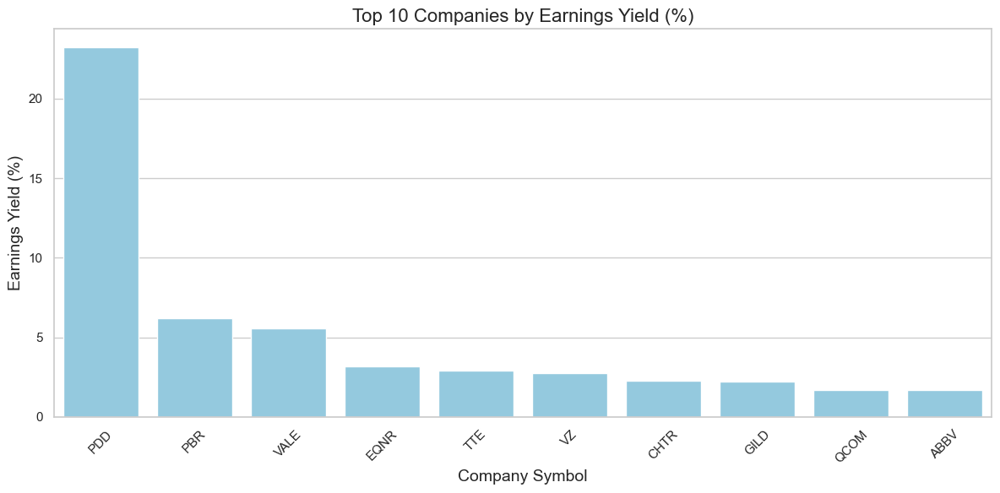

In [91]:
top_ten_sorted_by_ey = top_ten.sort_values(by='Earnings Yield (%)', ascending=False)

# Plot for Earnings Yield
plt.figure(figsize=(12, 6))
sns.barplot(x='Company Symbol', y='Earnings Yield (%)', data=top_ten_sorted_by_ey, color='skyblue')
plt.title('Top 10 Companies by Earnings Yield (%)', fontsize=16)
plt.xlabel('Company Symbol', fontsize=14)
plt.ylabel('Earnings Yield (%)', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



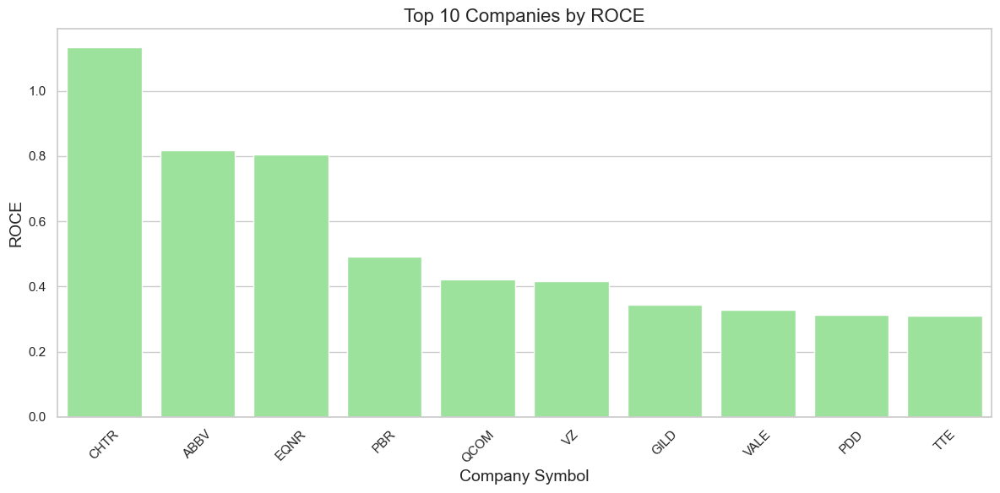

In [93]:
top_ten_sorted_by_roce = top_ten.sort_values(by='ROCE', ascending=False)

# Plot for ROCE
plt.figure(figsize=(12, 6))
sns.barplot(x='Company Symbol', y='ROCE', data=top_ten_sorted_by_roce, color='lightgreen')
plt.title('Top 10 Companies by ROCE', fontsize=16)
plt.xlabel('Company Symbol', fontsize=14)
plt.ylabel('ROCE', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()